# Situation

In 2023, Sunrise Life Insurance is looking to anticipate which customers are likely to lapse on their policies.
By identifying such customers, the company intends to proactively reach out to them with some customer care program in a bid to retain them.

To achieve this, Sunrise Life Insurance will need to employ predictive analytics techniques that can analyze vast amounts of data on customer and other relevant factors. Once the predictive model has been developed, company will use it to generate a list of customers who are at high risk of lapsing. 

The company will then reach out to these customers with tailored offers that are designed to meet their unique needs and preferences. The goal is to leverage data insights to improve customer satisfaction, reduce lapse, and increase customer loyalty.

# Task

## Import libraries

In [ ]:
!pip install scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import numpy as np
import plotly.figure_factory as ff
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from scipy import stats

## Import data

In [ ]:
# Train set
df1 = pd.read_excel('/content/drive/MyDrive/Prudential/Lapse_prediction_train.xlsx')
# Test set
df2 = pd.read_excel('/content/drive/MyDrive/Prudential/Lapse_prediction_test.xlsx')

In [ ]:
df1.head()

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
0,A05948,12,100000.00,M,M,399996.0,1.0,TYPE-B,43,2,ANNUAL,1194400,CANCELLED
1,A05490,17,100514.23,M,F,549996.0,1.0,TYPE-A,40,2,ANNUAL,739244,CANCELLED
2,A09094,12,100000.80,M,M,1299996.0,1.0,TYPE-B,40,2,MONTHLY,1341388,INFORCE
3,A05341,12,100000.99,M,M,500004.0,1.0,TYPE-B,50,3,ANNUAL,261533,CANCELLED
4,A08168,12,200001.60,M,male,499992.0,2.0,TYPE-B,45,2,MONTHLY,1355055,CANCELLED


In [ ]:
df2.head()

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
0,A01579,9,149999.88,M,M,549996.0,1,TYPE-B,44,2,MONTHLY,143988,NaN
1,A01732,9,100000.00,M,M,399996.0,5,TYPE-B,29,1,ANNUAL,584377,NaN
2,A01370,9,100000.00,M,M,999996.0,1,TYPE-B,57,2,ANNUAL,599099,NaN
3,A01091,9,100000.00,M,M,350004.0,1,TYPE-B,39,3,ANNUAL,301711,NaN
4,A01311,9,100000.80,S,M,300000.0,1,TYPE-B,29,0,MONTHLY,688,NaN


In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8807 entries, 0 to 8806
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   POLICY_OWNER_ID              8807 non-null   object 
 1   POLICY_TERM_YEARS            8807 non-null   int64  
 2   ANNUAL_FEES                  8807 non-null   float64
 3   POLICY_OWNER_MARITAL_STATUS  8807 non-null   object 
 4   POLICY_OWNER_GENDER          8807 non-null   object 
 5   POLICY_OWNER_ANNUAL_INCOME   7510 non-null   float64
 6   POLICY_OWNER_OCCUPATION_ID   8774 non-null   float64
 7   PRODUCT_TYPE                 8807 non-null   object 
 8   POLICY_OWNER_AGE_AT_ISSUE    8807 non-null   int64  
 9   TOTAL_LA                     8807 non-null   int64  
 10  PAYMENT_MODE                 8807 non-null   object 
 11  AGENT_CODE                   8807 non-null   object 
 12  LAPSE_STATUS                 8807 non-null   object 
dtypes: float64(3), int

In [ ]:
# Count pct of missing values
(df1['POLICY_OWNER_ANNUAL_INCOME'].isnull().sum()/len(df1['POLICY_OWNER_ANNUAL_INCOME']))*100

14.726921766776426

In [ ]:
# Count pct of missing values
(df1['POLICY_OWNER_ANNUAL_INCOME'].isnull().sum()/len(df1['POLICY_OWNER_ANNUAL_INCOME']))*100

14.726921766776426

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235 entries, 0 to 234
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   POLICY_OWNER_ID              235 non-null    object 
 1   POLICY_TERM_YEARS            235 non-null    int64  
 2   ANNUAL_FEES                  235 non-null    float64
 3   POLICY_OWNER_MARITAL_STATUS  235 non-null    object 
 4   POLICY_OWNER_GENDER          235 non-null    object 
 5   POLICY_OWNER_ANNUAL_INCOME   217 non-null    float64
 6   POLICY_OWNER_OCCUPATION_ID   235 non-null    int64  
 7   PRODUCT_TYPE                 235 non-null    object 
 8   POLICY_OWNER_AGE_AT_ISSUE    235 non-null    int64  
 9   TOTAL_LA                     235 non-null    int64  
 10  PAYMENT_MODE                 235 non-null    object 
 11  AGENT_CODE                   235 non-null    int64  
 12  LAPSE_STATUS                 0 non-null      float64
dtypes: float64(3), int64

In [ ]:
df1.describe()

,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA
count,8807.000000,8.807000e+03,7.510000e+03,8774.000000,8807.000000,8807.000000
mean,29.361871,1.767056e+05,1.117779e+06,1.614201,45.548541,1.425003
std,22.257148,2.454887e+05,4.715250e+06,1.323923,12.239941,1.142186
min,9.000000,9.999999e+04,9.996000e+03,1.000000,18.000000,0.000000
25%,12.000000,1.000000e+05,3.999960e+05,1.000000,37.000000,0.000000
50%,18.000000,1.169902e+05,5.499960e+05,1.000000,45.000000,1.000000
75%,37.000000,1.893579e+05,9.999960e+05,2.000000,55.000000,2.000000
max,102.000000,1.010000e+07,2.600000e+08,6.000000,70.000000,3.000000


In [ ]:
df2['POLICY_OWNER_GENDER'].value_counts()

M         160
F          50
male       16
MaLE        7
FEmale      2
Name: POLICY_OWNER_GENDER, dtype: int64

In [ ]:
df2['POLICY_OWNER_GENDER'].replace(['male','MaLE'],'M', inplace = True)
df2['POLICY_OWNER_GENDER'].replace('FEmale','F', inplace = True)

In [ ]:
df2['POLICY_OWNER_GENDER'].value_counts()

M    183
F     52
Name: POLICY_OWNER_GENDER, dtype: int64

In [ ]:
df1['POLICY_OWNER_GENDER'].value_counts()

M         5753
F         1901
male       642
MaLE       308
FEmale     203
Name: POLICY_OWNER_GENDER, dtype: int64

In [ ]:
df1['POLICY_OWNER_GENDER'].replace(['male','MaLE'],'M', inplace = True)
df1['POLICY_OWNER_GENDER'].replace('FEmale','F', inplace = True)

In [ ]:
df1['POLICY_OWNER_GENDER'].value_counts()

M    6703
F    2104
Name: POLICY_OWNER_GENDER, dtype: int64

Plotting correlation

In [ ]:
corr_heatmap=df1[['POLICY_TERM_YEARS','ANNUAL_FEES','POLICY_OWNER_ANNUAL_INCOME','POLICY_OWNER_AGE_AT_ISSUE','TOTAL_LA']]
x=corr_heatmap.corr(method='pearson').round(3)
ff.create_annotated_heatmap(z=x.values, x=x.columns.to_list(), y=x.columns.to_list(), colorscale='Viridis', showscale=True)

In [ ]:
# Create a function to highlight some columns
def highlight_columns(df1, rows=20, color='lightgreen', columns_to_shadow=[], columns_to_show=[]):
    highlight = lambda slice_of_df: 'background-color: %s' % color
    sample_df = df1.head(rows).copy() # Create a copy of the DataFrame
    sample_df.reset_index(inplace=True, drop=True)  # Reset the index
    if len(columns_to_show) != 0:
        sample_df = sample_df[columns_to_show]
    highlighted_df = sample_df.style.applymap(highlight, subset=pd.IndexSlice[:, columns_to_shadow])
    return highlighted_df

highlight_columns(df1.describe().T,columns_to_shadow=['min'])

,count,mean,std,min,25%,50%,75%,max
0,8807.000000,29.361871,22.257148,9.000000,12.000000,18.000000,37.000000,102.000000
1,8807.000000,176705.566805,245488.717212,99999.990000,100000.000000,116990.180000,189357.900000,10100000.000000
2,7510.000000,1117779.369907,4715249.879687,9996.000000,399996.000000,549996.000000,999996.000000,260000004.000000
3,8774.000000,1.614201,1.323923,1.000000,1.000000,1.000000,2.000000,6.000000
4,8807.000000,45.548541,12.239941,18.000000,37.000000,45.000000,55.000000,70.000000
5,8807.000000,1.425003,1.142186,0.000000,0.000000,1.000000,2.000000,3.000000


## Data Wrangling

Imputing the missing values. Describe how and explain your reasoning

**Types of Missing Data:**
1. Missing completely at random (MCAR)
2. Missing at random (MAR)
3. Missing not at random (MNAR)


In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8807 entries, 0 to 8806
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   POLICY_OWNER_ID              8807 non-null   object 
 1   POLICY_TERM_YEARS            8807 non-null   int64  
 2   ANNUAL_FEES                  8807 non-null   float64
 3   POLICY_OWNER_MARITAL_STATUS  8807 non-null   object 
 4   POLICY_OWNER_GENDER          8807 non-null   object 
 5   POLICY_OWNER_ANNUAL_INCOME   7510 non-null   float64
 6   POLICY_OWNER_OCCUPATION_ID   8774 non-null   float64
 7   PRODUCT_TYPE                 8807 non-null   object 
 8   POLICY_OWNER_AGE_AT_ISSUE    8807 non-null   int64  
 9   TOTAL_LA                     8807 non-null   int64  
 10  PAYMENT_MODE                 8807 non-null   object 
 11  AGENT_CODE                   8807 non-null   object 
 12  LAPSE_STATUS                 8807 non-null   object 
dtypes: float64(3), int

In [ ]:
df1.head(2)

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
0,A05948,12,100000.00,M,M,399996.0,1.0,TYPE-B,43,2,ANNUAL,1194400,CANCELLED
1,A05490,17,100514.23,M,F,549996.0,1.0,TYPE-A,40,2,ANNUAL,739244,CANCELLED


Find out if this case belongs to what type of missing values

In [ ]:
df_nan = df1[df1.isna().any(1)]
df_nan.head()

<ipython-input-21-6be96b299b24>:1: FutureWarning:

In a future version of pandas all arguments of DataFrame.any and Series.any will be keyword-only.



,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
9,A04004,27,100000.00,M,M,NaN,1.0,TYPE-B,60,3,ANNUAL,937399,INFORCE
13,A03206,52,100000.00,M,F,NaN,4.0,TYPE-B,43,1,ANNUAL,343344,INFORCE
30,A08266,17,149988.23,M,M,NaN,6.0,TYPE-A,64,1,ANNUAL,343344,INFORCE
32,A04438,27,100000.00,M,M,NaN,6.0,TYPE-B,62,0,SEMI-ANNUAL,693255,CANCELLED
37,A04491,38,100000.00,M,M,NaN,1.0,TYPE-B,62,3,SEMI-ANNUAL,825144,INFORCE


In [ ]:
df_nan[df_nan['POLICY_OWNER_AGE_AT_ISSUE'] < 20]

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
193,A03024,74,100000.0,S,F,NaN,6.0,TYPE-B,19,0,ANNUAL,343344,INFORCE
5421,A03287,74,200000.0,S,M,NaN,6.0,TYPE-B,19,0,ANNUAL,731577,INFORCE
5470,A00740,17,100000.0,S,F,NaN,4.0,TYPE-B,19,0,SEMI-ANNUAL,358600,INFORCE
5779,A04813,12,100000.0,M,M,NaN,1.0,TYPE-B,18,3,ANNUAL,872077,INFORCE
7454,A04814,12,100000.0,M,M,NaN,1.0,TYPE-B,18,2,ANNUAL,872077,INFORCE


Making assumptions about NaNs

Plotting age distribution in df_nan to state some assumptions

Assume that the NaNs in Annual Income is missing because these owners are too old, meaning they have rerired so they don't have salary.

In [ ]:
fig = px.histogram(df_nan, x='POLICY_OWNER_AGE_AT_ISSUE', opacity=0.7, color='POLICY_OWNER_GENDER',
                   labels={'POLICY_OWNER_AGE_AT_ISSUE': 'Age at Issue'}, color_discrete_sequence=['rgb(205,72,58)', 'rgb(31,120,180)'])
fig.update_layout(title='Age Distribution by Gender', xaxis_title='Age at Issue', yaxis_title='Count')
fig.show()

By looking at the graph above, we can see that most of them belong to the age group of 53 to 79. 

In Vietnam, for male at the age of 60 can be considered to retire. For female at the age of 55 or above can retire.


In [ ]:
fig = px.histogram(df_nan, x='POLICY_TERM_YEARS', opacity=0.7, color='POLICY_OWNER_GENDER',
                   labels={'POLICY_TERM_YEARS': 'Term Years'}, color_discrete_sequence=['rgb(205,72,58)', 'rgb(31,120,180)'])
fig.update_layout(title='Term Years Distribution by Gender', xaxis_title='Term Years at Issue', yaxis_title='Count')
fig.show()

Looking at the graph Term years Issue by gender above, we can accept the assumption above that the elderly do not have income annually, because the number of term years falls most at 14-29, this can be considered low term years since they are now above 50 years old (they might not live longer than 30 years so term years must be low).

Compare to the distribution of Age by Gender in the original df

In [ ]:
fig = px.histogram(df1, x='POLICY_OWNER_AGE_AT_ISSUE', opacity=0.7, color='POLICY_OWNER_GENDER',
                   labels={'POLICY_OWNER_AGE_AT_ISSUE': 'Age at Issue'}, color_discrete_sequence=['rgb(205,72,58)', 'rgb(31,120,180)'])
fig.update_layout(title='Age Distribution by Gender', xaxis_title='Age at Issue', yaxis_title='Count')
fig.show()

In [ ]:
fig = px.histogram(df1, x='POLICY_TERM_YEARS', opacity=0.7, color='POLICY_OWNER_GENDER',
                   labels={'POLICY_TERM_YEARS': 'Term Years'}, color_discrete_sequence=['rgb(205,72,58)', 'rgb(31,120,180)'])
fig.update_layout(title='Term Years Distribution by Gender', xaxis_title='Term Years at Issue', yaxis_title='Count')
fig.show()

Using chi-square to check examine the relationship between the missingness of a variable and other variables in my dataset.

Because if this case is MNAR, it is really hard to do imputation since it may cause affect on our statistics models later.

The first two options (MAR, NMAR) is easier to handle, so I just want to check whether this is MNAR or not.

### **Hypothesis:**

The missingness in Annual Income is not MNAR.

In [ ]:
import numpy as np
from scipy.stats import chi2_contingency

In [ ]:
contingency_table = pd.crosstab(df_nan['POLICY_OWNER_ANNUAL_INCOME'].isnull(), df_nan['POLICY_OWNER_AGE_AT_ISSUE'])

In [ ]:
chi2, p_value, _, _ = chi2_contingency(contingency_table)

In [ ]:
print(p_value)

0.41541636633678447


In [ ]:
alpha = 0.05  # significance level
if p_value < alpha:
    print("The missingness in 'POLICY_OWNER_ANNUAL_INCOME' is MNAR.")
else:
    print("The missingness in 'POLICY_OWNER_ANNUAL_INCOME' is not MNAR.")

The missingness in 'POLICY_OWNER_ANNUAL_INCOME' is not MNAR.


Try different vaiables with chi-square

In [ ]:
contingency_table_2 = pd.crosstab(df1['POLICY_OWNER_ANNUAL_INCOME'].isnull(), [pd.cut(df1['POLICY_OWNER_AGE_AT_ISSUE'], bins=[0, 20, 40, 60, 80, 100]), df1['POLICY_OWNER_GENDER']])
print(contingency_table_2)
chi2, p_value, _, _ = chi2_contingency(contingency_table_2)
print("The p-value result is:", p_value)

alpha = 0.05  # significance level
if p_value < alpha:
    print("The missingness in 'POLICY_OWNER_ANNUAL_INCOME' is MNAR.")
else:
    print("The missingness in 'POLICY_OWNER_ANNUAL_INCOME' is not MNAR.")

POLICY_OWNER_AGE_AT_ISSUE  (0, 20]     (20, 40]       (40, 60]       (60, 80]  \
POLICY_OWNER_GENDER              F   M        F     M        F     M        F   
POLICY_OWNER_ANNUAL_INCOME                                                      
False                           13  41      619  2305      969  2881      170   
True                             4   3       71   113      138   414      120   

POLICY_OWNER_AGE_AT_ISSUE        
POLICY_OWNER_GENDER           M  
POLICY_OWNER_ANNUAL_INCOME       
False                       512  
True                        434  
The p-value result is: 1.1177616574857255e-237
The missingness in 'POLICY_OWNER_ANNUAL_INCOME' is MNAR.


In [ ]:
contingency_table_3 = pd.crosstab(df1['POLICY_OWNER_ANNUAL_INCOME'].isnull(), df1['ANNUAL_FEES'])
print(contingency_table_3)
chi2, p_value, _, _ = chi2_contingency(contingency_table_3)
print("The p-value result is:", p_value)

alpha = 0.05  # significance level
if p_value < alpha:
    print("The missingness in 'POLICY_OWNER_ANNUAL_INCOME' is MNAR.")
else:
    print("The missingness in 'POLICY_OWNER_ANNUAL_INCOME' is not MNAR.")

ANNUAL_FEES                 99999.99     100000.00    100000.02    \
POLICY_OWNER_ANNUAL_INCOME                                          
False                                 0         2271            2   
True                                  1          456            5   

ANNUAL_FEES                 100000.03    100000.06    100000.08    \
POLICY_OWNER_ANNUAL_INCOME                                          
False                                 0            4            3   
True                                  1            0            0   

ANNUAL_FEES                 100000.09    100000.10    100000.11    \
POLICY_OWNER_ANNUAL_INCOME                                          
False                                11            6            6   
True                                  1            0            0   

ANNUAL_FEES                 100000.12    ...  2010000.00   2500000.00   \
POLICY_OWNER_ANNUAL_INCOME               ...                             
False                

### Observations:

This is NOT perhaps a case of **Missing not at random (MNAR)** which requires experts in this domain to decide what are the right solutions.

**In the case of MNAR as well, the statistical analysis might result in bias.** Luckily, this is just a random missing.

### Try MICE


MICE is a well-known technique for missing imputation so far.

In [ ]:
# Replace non-numeric values with NaN
df1['AGENT_CODE'] = df1['AGENT_CODE'].replace('..', np.NaN)

# Create a copy of the dataframe for imputation
df_imputed = df1.copy()

# Initialize the MICE imputer
imputer = IterativeImputer(random_state=100, max_iter=10)

# Exclude 'AGENT_CODE' column from imputation
columns_to_impute = df_imputed.columns.drop(['AGENT_CODE', 'POLICY_OWNER_ID', 'POLICY_OWNER_MARITAL_STATUS', 'POLICY_OWNER_GENDER', 'PRODUCT_TYPE', 'PAYMENT_MODE', 'LAPSE_STATUS'])

# Perform imputation on selected columns
df_imputed[columns_to_impute] = imputer.fit_transform(df_imputed[columns_to_impute])

Checking evaluation on Mice imputation

In [ ]:
true_values = df1['POLICY_OWNER_ANNUAL_INCOME']
imputed_values = df_imputed['POLICY_OWNER_ANNUAL_INCOME']

mae = np.mean(np.abs(true_values - imputed_values))
print("Mean Absolute Error (MAE):", mae)

Mean Absolute Error (MAE): 0.0


In [ ]:
# Drop rows with null values in 'AGENT_CODE' column
df_imputed = df_imputed.dropna(subset=['AGENT_CODE'])
df_imputed['AGENT_CODE'].isnull().sum()

0

In [ ]:
# Looking at the original NaNs in Policy Owner Annual Income
highlight_columns(df1[df1.isna().any(axis=1)].head(15),columns_to_shadow=['POLICY_OWNER_ANNUAL_INCOME'])

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
0,A04004,27,100000.000000,M,M,nan,1.000000,TYPE-B,60,3,ANNUAL,937399.000000,INFORCE
1,A03206,52,100000.000000,M,F,nan,4.000000,TYPE-B,43,1,ANNUAL,343344.000000,INFORCE
2,A08266,17,149988.230000,M,M,nan,6.000000,TYPE-A,64,1,ANNUAL,343344.000000,INFORCE
3,A04438,27,100000.000000,M,M,nan,6.000000,TYPE-B,62,0,SEMI-ANNUAL,693255.000000,CANCELLED
4,A04491,38,100000.000000,M,M,nan,1.000000,TYPE-B,62,3,SEMI-ANNUAL,825144.000000,INFORCE
5,A04978,12,200001.000000,M,M,nan,1.000000,TYPE-B,50,0,ANNUAL,614377.000000,INFORCE
6,A02877,70,100000.000000,M,M,nan,1.000000,TYPE-B,55,0,ANNUAL,560833.000000,INFORCE
7,A05379,12,150000.000000,M,F,nan,1.000000,TYPE-B,43,0,ANNUAL,499499.000000,CANCELLED
8,A00104,17,100000.000000,M,M,nan,1.000000,TYPE-B,51,0,SEMI-ANNUAL,26511.000000,CANCELLED
9,A00757,12,119999.880000,M,F,nan,4.000000,TYPE-B,52,2,MONTHLY,35922.000000,CANCELLED


In [ ]:
# This is after MICE imputation, iloc[[0,1,2,5,7,9,10,11,12,15]]
highlight_columns(df_imputed.head(15),columns_to_shadow=['POLICY_OWNER_ANNUAL_INCOME'])

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
0,A05948,12.000000,100000.000000,M,M,399996.000000,1.000000,TYPE-B,43.000000,2.000000,ANNUAL,1194400.000000,CANCELLED
1,A05490,17.000000,100514.230000,M,F,549996.000000,1.000000,TYPE-A,40.000000,2.000000,ANNUAL,739244.000000,CANCELLED
2,A09094,12.000000,100000.800000,M,M,1299996.000000,1.000000,TYPE-B,40.000000,2.000000,MONTHLY,1341388.000000,INFORCE
3,A05341,12.000000,100000.990000,M,M,500004.000000,1.000000,TYPE-B,50.000000,3.000000,ANNUAL,261533.000000,CANCELLED
4,A08168,12.000000,200001.600000,M,M,499992.000000,2.000000,TYPE-B,45.000000,2.000000,MONTHLY,1355055.000000,CANCELLED
5,A05541,12.000000,100000.800000,M,M,298992.000000,1.000000,TYPE-B,45.000000,3.000000,MONTHLY,570900.000000,INFORCE
6,A00001,29.000000,113125.000000,M,M,25200000.000000,1.000000,TYPE-B,45.000000,2.000000,ANNUAL,477.000000,INFORCE
7,A09223,12.000000,144001.080000,M,F,999996.000000,2.000000,TYPE-B,43.000000,2.000000,MONTHLY,1428055.000000,INFORCE
8,A00350,17.000000,180000.000000,M,M,750000.000000,1.000000,TYPE-B,33.000000,1.000000,MONTHLY,210511.000000,CANCELLED
9,A04004,27.000000,100000.000000,M,M,812746.483509,1.000000,TYPE-B,60.000000,3.000000,ANNUAL,937399.000000,INFORCE


In [ ]:
df_imputed['LAPSE_STATUS'].value_counts()

INFORCE      6092
CANCELLED    2714
Name: LAPSE_STATUS, dtype: int64

In [ ]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8806 entries, 0 to 8806
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   POLICY_OWNER_ID              8806 non-null   object 
 1   POLICY_TERM_YEARS            8806 non-null   float64
 2   ANNUAL_FEES                  8806 non-null   float64
 3   POLICY_OWNER_MARITAL_STATUS  8806 non-null   object 
 4   POLICY_OWNER_GENDER          8806 non-null   object 
 5   POLICY_OWNER_ANNUAL_INCOME   8806 non-null   float64
 6   POLICY_OWNER_OCCUPATION_ID   8806 non-null   float64
 7   PRODUCT_TYPE                 8806 non-null   object 
 8   POLICY_OWNER_AGE_AT_ISSUE    8806 non-null   float64
 9   TOTAL_LA                     8806 non-null   float64
 10  PAYMENT_MODE                 8806 non-null   object 
 11  AGENT_CODE                   8806 non-null   float64
 12  LAPSE_STATUS                 8806 non-null   object 
dtypes: float64(7), obj

In [ ]:
df_imputed.head(2)

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
0,A05948,12.0,100000.00,M,M,399996.0,1.0,TYPE-B,43.0,2.0,ANNUAL,1194400.0,CANCELLED
1,A05490,17.0,100514.23,M,F,549996.0,1.0,TYPE-A,40.0,2.0,ANNUAL,739244.0,CANCELLED


In [ ]:
df_imputed['POLICY_TERM_YEARS'] = df_imputed['POLICY_TERM_YEARS'].astype(int)
df_imputed['POLICY_OWNER_ANNUAL_INCOME'] = df_imputed['POLICY_OWNER_ANNUAL_INCOME'].astype(int)
df_imputed['POLICY_OWNER_OCCUPATION_ID'] = df_imputed['POLICY_OWNER_OCCUPATION_ID'].astype(int)
df_imputed['POLICY_OWNER_AGE_AT_ISSUE'] = df_imputed['POLICY_OWNER_AGE_AT_ISSUE'].astype(int)
df_imputed['TOTAL_LA'] = df_imputed['TOTAL_LA'].astype(int)
df_imputed['AGENT_CODE'] = df_imputed['AGENT_CODE'].astype(int)

Test set cleaning

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235 entries, 0 to 234
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   POLICY_OWNER_ID              235 non-null    object 
 1   POLICY_TERM_YEARS            235 non-null    int64  
 2   ANNUAL_FEES                  235 non-null    float64
 3   POLICY_OWNER_MARITAL_STATUS  235 non-null    object 
 4   POLICY_OWNER_GENDER          235 non-null    object 
 5   POLICY_OWNER_ANNUAL_INCOME   217 non-null    float64
 6   POLICY_OWNER_OCCUPATION_ID   235 non-null    int64  
 7   PRODUCT_TYPE                 235 non-null    object 
 8   POLICY_OWNER_AGE_AT_ISSUE    235 non-null    int64  
 9   TOTAL_LA                     235 non-null    int64  
 10  PAYMENT_MODE                 235 non-null    object 
 11  AGENT_CODE                   235 non-null    int64  
 12  LAPSE_STATUS                 0 non-null      float64
dtypes: float64(3), int64

In [ ]:
# Create a copy of the dataframe for imputation
df_imputed_2 = df2.copy()
# Initialize the MICE imputer
imputer = IterativeImputer(random_state=100, max_iter=10)

# Exclude 'AGENT_CODE' column from imputation
columns_to_impute = df_imputed_2.columns.drop(['AGENT_CODE', 'POLICY_OWNER_ID', 'POLICY_OWNER_MARITAL_STATUS', 'POLICY_OWNER_GENDER', 'PRODUCT_TYPE', 'PAYMENT_MODE', 'LAPSE_STATUS'])

# Perform imputation on selected columns
df_imputed_2[columns_to_impute] = imputer.fit_transform(df_imputed_2[columns_to_impute])

In [ ]:
true_values_2 = df2['POLICY_OWNER_ANNUAL_INCOME']
imputed_values_2 = df_imputed_2['POLICY_OWNER_ANNUAL_INCOME']

mae = np.mean(np.abs(true_values_2 - imputed_values_2))
print("Mean Absolute Error (MAE):", mae)

Mean Absolute Error (MAE): 0.0


In [ ]:
# Looking at the original NaNs in Policy Owner Annual Income, .any(axis=1)
highlight_columns(df2[df2['POLICY_OWNER_ANNUAL_INCOME'].isnull()].head(15),columns_to_shadow=['POLICY_OWNER_ANNUAL_INCOME'])

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
0,A01146,9,100000.000000,M,M,nan,1,TYPE-B,49,0,ANNUAL,544200,nan
1,A05334,12,100000.000000,M,M,nan,1,TYPE-B,67,3,ANNUAL,1149511,nan
2,A05616,12,150000.000000,M,F,nan,1,TYPE-B,45,0,ANNUAL,565711,nan
3,A04403,12,500000.000000,M,M,nan,1,TYPE-B,48,0,ANNUAL,1116700,nan
4,A05470,12,100534.490000,M,M,nan,6,TYPE-A,62,2,ANNUAL,1165800,nan
5,A00484,12,100000.000000,M,F,nan,4,TYPE-B,35,1,ANNUAL,192044,nan
6,A02123,12,100000.000000,M,M,nan,1,TYPE-B,66,0,ANNUAL,343666,nan
7,A04400,12,100000.800000,M,M,nan,1,TYPE-B,55,0,MONTHLY,344400,nan
8,A01719,12,100000.000000,M,M,nan,1,TYPE-B,54,0,ANNUAL,538877,nan
9,A05425,12,100002.000000,M,M,nan,6,TYPE-B,63,1,ANNUAL,1193800,nan


In [ ]:
# This is after MICE imputation
highlight_columns(df_imputed_2.iloc[[0,1,2,5,7,9,10,11,12,15]],columns_to_shadow=['POLICY_OWNER_ANNUAL_INCOME'])

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
0,A01579,9.000000,149999.880000,M,M,549996.000000,1.000000,TYPE-B,44.000000,2.000000,MONTHLY,143988,nan
1,A01732,9.000000,100000.000000,M,M,399996.000000,5.000000,TYPE-B,29.000000,1.000000,ANNUAL,584377,nan
2,A01370,9.000000,100000.000000,M,M,999996.000000,1.000000,TYPE-B,57.000000,2.000000,ANNUAL,599099,nan
3,A01512,9.000000,100000.000000,S,M,540000.000000,1.000000,TYPE-B,26.000000,0.000000,ANNUAL,24544,nan
4,A03680,9.000000,100000.000000,M,M,309996.000000,1.000000,TYPE-B,49.000000,2.000000,ANNUAL,452233,nan
5,A01473,9.000000,200000.280000,S,M,450000.000000,1.000000,TYPE-B,22.000000,0.000000,MONTHLY,545122,nan
6,A01513,9.000000,100000.000000,M,M,500004.000000,1.000000,TYPE-B,35.000000,2.000000,ANNUAL,285233,nan
7,A01254,9.000000,100000.800000,M,M,300000.000000,1.000000,TYPE-B,43.000000,1.000000,MONTHLY,131988,nan
8,A04964,12.000000,100200.720000,M,M,500004.000000,1.000000,TYPE-B,34.000000,3.000000,MONTHLY,848411,nan
9,A02389,12.000000,150000.000000,M,M,349992.000000,5.000000,TYPE-B,30.000000,3.000000,ANNUAL,639677,nan


In [ ]:
df_imputed_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235 entries, 0 to 234
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   POLICY_OWNER_ID              235 non-null    object 
 1   POLICY_TERM_YEARS            235 non-null    float64
 2   ANNUAL_FEES                  235 non-null    float64
 3   POLICY_OWNER_MARITAL_STATUS  235 non-null    object 
 4   POLICY_OWNER_GENDER          235 non-null    object 
 5   POLICY_OWNER_ANNUAL_INCOME   235 non-null    float64
 6   POLICY_OWNER_OCCUPATION_ID   235 non-null    float64
 7   PRODUCT_TYPE                 235 non-null    object 
 8   POLICY_OWNER_AGE_AT_ISSUE    235 non-null    float64
 9   TOTAL_LA                     235 non-null    float64
 10  PAYMENT_MODE                 235 non-null    object 
 11  AGENT_CODE                   235 non-null    int64  
 12  LAPSE_STATUS                 0 non-null      float64
dtypes: float64(7), int64

In [ ]:
df_imputed_2['POLICY_TERM_YEARS'] = df_imputed_2['POLICY_TERM_YEARS'].astype(int)
df_imputed_2['POLICY_OWNER_ANNUAL_INCOME'] = df_imputed_2['POLICY_OWNER_ANNUAL_INCOME'].astype(int)
df_imputed_2['POLICY_OWNER_OCCUPATION_ID'] = df_imputed_2['POLICY_OWNER_OCCUPATION_ID'].astype(int)
df_imputed_2['POLICY_OWNER_AGE_AT_ISSUE'] = df_imputed_2['POLICY_OWNER_AGE_AT_ISSUE'].astype(int)
df_imputed_2['TOTAL_LA'] = df_imputed_2['TOTAL_LA'].astype(int)

In [ ]:
df_imputed_2['POLICY_OWNER_GENDER'].value_counts()

M    183
F     52
Name: POLICY_OWNER_GENDER, dtype: int64

Now the train and test datasets seem to be perfect, we will move to the EDA part.

# EDA

In [ ]:
df_imputed.head(2)

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
0,A05948,12,100000.00,M,M,399996,1,TYPE-B,43,2,ANNUAL,1194400,CANCELLED
1,A05490,17,100514.23,M,F,549996,1,TYPE-A,40,2,ANNUAL,739244,CANCELLED


#### Income

In [ ]:
# Distribution of POLICY_OWNER_ANNUAL_INCOME
fig = px.histogram(df_imputed, x='POLICY_OWNER_ANNUAL_INCOME', nbins=10, opacity=0.7,
                   labels={'POLICY_OWNER_ANNUAL_INCOME': 'Annual Income'}, color_discrete_sequence=['rgb(205,72,58)'])
fig.update_layout(title='Distribution of Policy Owner Anual Income', xaxis_title='Annual Income')
fig.show()

Most of clients have income from 0-50M

In [ ]:
# Income variation across POLICY_OWNER_OCCUPATION_ID categories
fig = px.box(df_imputed, x='POLICY_OWNER_OCCUPATION_ID', y='POLICY_OWNER_ANNUAL_INCOME', color='POLICY_OWNER_OCCUPATION_ID',
             labels={'POLICY_OWNER_OCCUPATION_ID': 'Occupation ID', 'POLICY_OWNER_ANNUAL_INCOME': 'Annual Income'},
             color_discrete_sequence=['rgb(205,72,58)'])
fig.update_layout(title='Income Variation across Policy Owner Occupation ID Categories', xaxis_title='Occupation ID', yaxis_title='Annual Income')
fig.show()

**Observations:**

In terms of Annual Income:
1. The Annual Income in Occupation ID 1 is more dispersed than the rest.
2. Occupation ID does not have any value (we should re-check this).


In [ ]:
df_imputed['POLICY_OWNER_OCCUPATION_ID'].value_counts()

1    6384
2    1517
6     438
5     290
4     176
3       1
Name: POLICY_OWNER_OCCUPATION_ID, dtype: int64

Occupation of policy owner 1 has the highest annual income, with maximum is 260M

Is that true that people who have good annual income are willing to have more policy term years?

In [ ]:
# Correlation between income and POLICY_TERM_YEARS
fig = px.scatter(df_imputed, x='POLICY_TERM_YEARS', y='POLICY_OWNER_ANNUAL_INCOME', #trendline='ols',
                 labels={'POLICY_TERM_YEARS': 'Policy Term (Years)', 'POLICY_OWNER_ANNUAL_INCOME': 'Annual Income'},
                 color_discrete_sequence=['rgb(205,72,58)'])
fig.update_layout(title='Correlation between Policy Term Years and Policty Owner Annual Income', xaxis_title='Policy Term (Years)', yaxis_title='Annual Income')
fig.show()

It seems like the assumption above is not true, there is no significant relationship between Annual Income and Policy Term Years.

### Gender

In [ ]:
# Compare average POLICY_OWNER_AGE_AT_ISSUE for different gender groups
gender_age_avg = df_imputed.groupby('POLICY_OWNER_GENDER')['POLICY_OWNER_AGE_AT_ISSUE'].mean().reset_index()
fig = px.bar(gender_age_avg, x='POLICY_OWNER_GENDER', y='POLICY_OWNER_AGE_AT_ISSUE',
             labels={'POLICY_OWNER_GENDER': 'Gender', 'POLICY_OWNER_AGE_AT_ISSUE': 'Average Age'},
             color_discrete_sequence=['rgb(205,72,58)'])
fig.update_layout(title='Average Policy Owner Age At Issue by Gender')
fig.show()

**Observations:**

There is no difference between the age of genders

Do Male has more income than Female?

In [ ]:
# Plotting graph shows Distribution of Annual Income by Gender
fig = px.box(df_imputed, x='POLICY_OWNER_GENDER', y='POLICY_OWNER_ANNUAL_INCOME', color='POLICY_OWNER_GENDER',
             labels={'POLICY_OWNER_GENDER': 'Gender', 'POLICY_OWNER_ANNUAL_INCOME': 'Annual Income'},
             color_discrete_sequence=['rgb(205,72,58)'])
fig.update_layout(title='Distribution of Annual Income by Gender')
fig.show()

Male's Annual Income seems to be more dispersed than Female's Annual Income.

In [ ]:
# Plotting graph shows Distribution of Annual Fees by Gender
fig = px.box(df_imputed, x='POLICY_OWNER_GENDER', y='ANNUAL_FEES', color='POLICY_OWNER_GENDER',
             labels={'POLICY_OWNER_GENDER': 'Gender', 'ANNUAL_FEES': 'Annual Fees'},
             color_discrete_sequence=['rgb(205,72,58)'])
fig.update_layout(title='Distribution of Annual Fees by Gender')
fig.show()

**Observations:**

Annual Fees from male is also higher than female because the more term-year they have, the more fees they will have to pay for the Insurance Company.

In [ ]:
# Plotting graph shows Distribution of Term Years by Gender
fig = px.box(df_imputed, x='POLICY_OWNER_GENDER', y='POLICY_TERM_YEARS', color='POLICY_OWNER_GENDER',
             labels={'POLICY_OWNER_GENDER': 'Gender', 'POLICY_TERM_YEARS': 'Term Years'},
             color_discrete_sequence=['rgb(205,72,58)'])
fig.update_layout(title='Distribution of Term Years by Gender')
fig.show()

In [ ]:
# Group the data by gender and marital status and count the occurrences
grouped_data = df_imputed.groupby(['POLICY_OWNER_GENDER', 'POLICY_OWNER_MARITAL_STATUS']).size().reset_index(name='Count')

# Calculate the total count for each gender
total_counts = grouped_data.groupby('POLICY_OWNER_GENDER')['Count'].transform('sum')
grouped_data['Percentage'] = (grouped_data['Count'] / total_counts) * 100

# Define the colors for each marital status
colors = ['rgb(205,72,58)', 'rgb(217,120,107)', 'rgb(229,169,156)', 'rgb(241,218,205)']
fig = go.Figure()

for i, marital_status in enumerate(grouped_data['POLICY_OWNER_MARITAL_STATUS'].unique()):
    data_subset = grouped_data[grouped_data['POLICY_OWNER_MARITAL_STATUS'] == marital_status]
    fig.add_trace(go.Bar(x=data_subset['POLICY_OWNER_GENDER'], y=data_subset['Count'], 
                         text=data_subset['Percentage'].round(2).astype(str) + '%', 
                         name=str(marital_status), marker_color=colors[i], textposition='auto'))

fig.update_layout(title='Distribution of Marital Status by Gender', xaxis_title='Gender', yaxis_title='Count')
fig.show()


In [ ]:
# Group the data by gender and lapse status and count the occurrences
grouped_data = df_imputed.groupby(['POLICY_OWNER_GENDER', 'LAPSE_STATUS']).size().reset_index(name='Count')
# Calculate the total count for each gender
total_counts = grouped_data.groupby('POLICY_OWNER_GENDER')['Count'].transform('sum')
grouped_data['Percentage'] = (grouped_data['Count'] / total_counts) * 100


# Define the colors for each lapse status
colors = ['rgb(205,72,58)', 'rgb(217,120,107)']
# Create the stacked bar plot
fig = go.Figure()

for i, status in enumerate(grouped_data['LAPSE_STATUS'].unique()):
    data_subset = grouped_data[grouped_data['LAPSE_STATUS'] == status]
    fig.add_trace(go.Bar(x=data_subset['POLICY_OWNER_GENDER'], y=data_subset['Count'], 
                         text=data_subset['Percentage'].round(2).astype(str) + '%', 
                         name=status, marker_color=colors[i], textposition='auto'))

fig.update_layout(title='Distribution of Lapse Status by Gender', xaxis_title='Gender', yaxis_title='Count')
fig.show()

**Observations:**

The perecentage of inforce in Male is less than Female, whereas the cancelled ratio of Male is bigger than Female



In [ ]:
# Group by gender and lapse status and calculate the count and percentage
gender_lapse_counts = df_imputed.groupby(['POLICY_OWNER_GENDER', 'LAPSE_STATUS']).size().reset_index(name='Count')
gender_totals = gender_lapse_counts.groupby('POLICY_OWNER_GENDER')['Count'].sum().reset_index(name='Total')
gender_lapse_counts = gender_lapse_counts.merge(gender_totals, on='POLICY_OWNER_GENDER')
gender_lapse_counts['Percentage'] = (gender_lapse_counts['Count'] / gender_lapse_counts['Total']) * 100

# Create the stacked bar plot with percentages
fig = go.Figure()

for lapse_type in gender_lapse_counts['LAPSE_STATUS'].unique():
    filtered_data = gender_lapse_counts[gender_lapse_counts['LAPSE_STATUS'] == lapse_type]
    fig.add_trace(go.Bar( x = filtered_data['POLICY_OWNER_GENDER'], y= filtered_data['Count'],
                         text = filtered_data['Percentage'].round(2), textposition='auto', name=lapse_type))

fig.update_layout(title='Lapse Status by Gender', xaxis_title='Gender', yaxis_title='Count',
                  legend_title='Lapse Status', barmode='stack',
                  colorway=['rgb(205,72,58)', 'rgb(217,120,107)'])
fig.update_traces(texttemplate='%{text}%', textfont_size=10)
fig.show()

Age distribution by Genders

In [ ]:
df_imputed['POLICY_OWNER_GENDER'].value_counts()

M    6703
F    2103
Name: POLICY_OWNER_GENDER, dtype: int64

In [ ]:
# Filter the data by gender
male_data = df_imputed[df_imputed['POLICY_OWNER_GENDER'] == 'M']
female_data = df_imputed[df_imputed['POLICY_OWNER_GENDER'] == 'F']

fig = px.histogram(male_data, x='POLICY_OWNER_AGE_AT_ISSUE', opacity=0.7, color='POLICY_OWNER_GENDER',
                   labels={'POLICY_OWNER_AGE_AT_ISSUE': 'Age at Issue'}, color_discrete_sequence=['rgb(205,72,58)'])
fig.update_traces(marker=dict(line=dict(color='rgb(205,72,58)', width=1.5)))
fig.update_layout(title='Age Distribution by Gender (Male)', xaxis_title='Age at Issue', yaxis_title='Count')
fig.show()

fig = px.histogram(female_data, x='POLICY_OWNER_AGE_AT_ISSUE', opacity=0.7, color='POLICY_OWNER_GENDER',
                   labels={'POLICY_OWNER_AGE_AT_ISSUE': 'Age at Issue'}, color_discrete_sequence=['rgb(31,120,180)'])
fig.update_traces(marker=dict(line=dict(color='rgb(31,120,180)', width=1.5)))
fig.update_layout(title='Age Distribution by Gender (Female)', xaxis_title='Age at Issue', yaxis_title='Count')
fig.show()


In [ ]:
# Combine male and female data
combined_data = pd.concat([male_data, female_data])

fig = px.histogram(combined_data, x='POLICY_OWNER_AGE_AT_ISSUE', opacity=0.7, color='POLICY_OWNER_GENDER',
                   facet_col='POLICY_OWNER_GENDER', labels={'POLICY_OWNER_AGE_AT_ISSUE': 'Age at Issue'},
                   color_discrete_sequence=['rgb(205,72,58)', 'rgb(31,120,180)'])
fig.update_traces(marker=dict(line=dict(color='rgb(205,72,58)', width=1.5)))
fig.update_layout(title='Age Distribution by Gender', xaxis_title='Age at Issue', yaxis_title='Count')
fig.show()

In [ ]:
fig = px.box(df_imputed, x='POLICY_OWNER_GENDER', y='POLICY_OWNER_AGE_AT_ISSUE', color='POLICY_OWNER_GENDER',
              labels={'POLICY_OWNER_GENDER': 'Gender', 'POLICY_OWNER_AGE_AT_ISSUE': 'Age at Issue'},
              color_discrete_sequence=['rgb(205,72,58)', 'rgb(31,120,180)'])
fig.update_traces(marker=dict(line=dict(color='rgb(205,72,58)', width=1.5)))
fig.update_layout(title='Age Distribution by Gender', xaxis_title='Gender', yaxis_title='Age at Issue')
fig.show()

#### Observations:
About Gender, it is obvious that male seems to use insurance more than Female:

1. The average age between two genders are not different much
2. In term of Annual Income, Male has more Salary than Female
3. This also leads to Male will have more Annual Fees than Female
4. Male also longer term years than Female (the median of Male is 21 5.5. wheares Female is 17)
6. In Marital Status, we have more married male than female
7. For lapse status, Male with Inforce is higher than Female Inforce


#### Insight:

A survey shows that women play an important role in life insurance decisions, but they are more likely to buy life insurance for their husbands - the main breadwinner of the family and sometimes for their children first.

[Link](https://baodautu.vn/bao-hiem-nhan-tho-ho-tro-phu-nu-de-cung-phat-trien-tai-viet-nam-d103678.html)

Action:
1. Conduct marketing strategies (heart touching campagins) to target each gender specifically. This can involve offering different insurance products or packages that align with their income levels and financial goals.
2. Focus on exploiting the elderly group in women using life insurance, this can be done by:
  + Diversify insurance distribution channels for Female

  + Change people's perception of life insurance (The perception that life insurance is only for the breadwinner is changing and tends to recognize the intangible economic value of mothers (housewives, housekeepers, parenting...)

### Mariage Status

In [ ]:
# Analyze distribution of POLICY_TERM_YEARS based on marital status
fig = px.box(df_imputed, x='POLICY_OWNER_MARITAL_STATUS', y='POLICY_TERM_YEARS',
             labels={'POLICY_OWNER_MARITAL_STATUS': 'Marital Status', 'POLICY_TERM_YEARS': 'Policy Term (Years)'},
             color_discrete_sequence=['rgb(205,72,58)'])
fig.update_layout(title='Distribution of Policy Term Years by Marital Status')
fig.show()

**Observations:**

The median Policy term-year of Marriage is 19.5 while Single is 17. It does not seem right because parents should have more term-year than Single type.
As we can see in the dispersion of Marriage, a lot of owners choose to have more term-year than Single person.

We should exploit the Marriage type to have more term-year by advising them, show them how important it is if they have insurrance for their family members.

In [ ]:
# Analyze distribution of Annual Fees based on marital status
fig = px.box(df_imputed, x='POLICY_OWNER_MARITAL_STATUS', y='ANNUAL_FEES',
             labels={'POLICY_OWNER_MARITAL_STATUS': 'Marital Status', 'ANNUAL_FEES': 'Annual Fees'},
             color_discrete_sequence=['rgb(205,72,58)'])
fig.update_layout(title='Distribution of Annual Fees by Marital Status')
fig.show()

In [ ]:
# Analyze distribution of Age based on marital status
fig = px.box(df_imputed, x='POLICY_OWNER_MARITAL_STATUS', y='POLICY_OWNER_AGE_AT_ISSUE',
             labels={'POLICY_OWNER_MARITAL_STATUS': 'Marital Status', 'POLICY_OWNER_AGE_AT_ISSUE': 'Age'},
             color_discrete_sequence=['rgb(205,72,58)'])
fig.update_layout(title='Distribution of Age by Marital Status')
fig.show()

### Product

In [ ]:
# Distribution of PRODUCT_TYPE
product_counts = df_imputed['PRODUCT_TYPE'].value_counts().reset_index()
product_counts.columns = ['PRODUCT_TYPE', 'Count']
fig = px.pie(product_counts, values='Count', names='PRODUCT_TYPE', color_discrete_sequence=['rgb(205,72,58)'])
fig.update_traces(textinfo='percent+label', textfont_size=12)
fig.update_layout(title='Distribution of Product Type')
fig.show()

In [ ]:
# Group by gender and product type and calculate the count and percentage
gender_product_counts = df_imputed.groupby(['POLICY_OWNER_GENDER', 'PRODUCT_TYPE']).size().reset_index(name='Count')
gender_totals = gender_product_counts.groupby('POLICY_OWNER_GENDER')['Count'].sum().reset_index(name='Total')
gender_product_counts = gender_product_counts.merge(gender_totals, on='POLICY_OWNER_GENDER')
gender_product_counts['Percentage'] = (gender_product_counts['Count'] / gender_product_counts['Total']) * 100

# Create the stacked bar plot with percentages
fig = go.Figure()

for product_type in gender_product_counts['PRODUCT_TYPE'].unique():
    filtered_data = gender_product_counts[gender_product_counts['PRODUCT_TYPE'] == product_type]
    fig.add_trace(go.Bar(x=filtered_data['POLICY_OWNER_GENDER'], y=filtered_data['Count'],
                         text=filtered_data['Percentage'].round(2), textposition='auto', name=product_type))

fig.update_layout(title='Product Usage by Gender', xaxis_title='Gender', yaxis_title='Count',
                  legend_title='Product Type', barmode='stack',
                  colorway=['rgb(205,72,58)', 'rgb(217,120,107)'])
fig.update_traces(texttemplate='%{text}%', textfont_size=10)
fig.show()

In [ ]:
# Analyze distribution of fee based on product types
fig = px.box(df_imputed, x='PRODUCT_TYPE', y='ANNUAL_FEES',
             labels={'PRODUCT_TYPE': 'Product Types', 'ANNUAL_FEES': 'Fees'},
             color_discrete_sequence=['rgb(205,72,58)'])
fig.update_layout(title='Distribution of Fees by Product Types')
fig.show()

Observations:

1. Clients prefer Product Type B more than Type A
2. In **male** gender, the percentage of using Product Type B is ~68% while Type A only has 32%
3. In **female** gender, the percentage of using Product Type B is ~62% while Type A only has 38%.

### Payment Mode

In [ ]:
# Distribution of PAYMENT_MODE
payment_counts = df_imputed['PAYMENT_MODE'].value_counts().reset_index()
payment_counts.columns = ['PAYMENT_MODE', 'Count']

fig = px.bar(payment_counts, x='PAYMENT_MODE', y='Count',labels={'PAYMENT_MODE': 'Payment Mode', 'Count': 'Count'},
             color='PAYMENT_MODE', color_discrete_sequence=['rgb(205,72,58)'])
fig.update_layout(title='Distribution of Payment Mode')
fig.show()

In [ ]:
# Group by gender and product type and calculate the count and percentage
gender_payment_counts = df_imputed.groupby(['POLICY_OWNER_GENDER', 'PAYMENT_MODE']).size().reset_index(name='Count')
gender_totals = gender_payment_counts.groupby('POLICY_OWNER_GENDER')['Count'].sum().reset_index(name='Total')
gender_payment_counts = gender_payment_counts.merge(gender_totals, on='POLICY_OWNER_GENDER')
gender_payment_counts['Percentage'] = (gender_payment_counts['Count'] / gender_payment_counts['Total']) * 100

# Create the stacked bar plot with percentages
fig = go.Figure()

for payment_type in gender_payment_counts['PAYMENT_MODE'].unique():
    filtered_data = gender_payment_counts[gender_payment_counts['PAYMENT_MODE'] == payment_type]
    fig.add_trace(go.Bar(x=filtered_data['POLICY_OWNER_GENDER'], y=filtered_data['Count'],
                         text=filtered_data['Percentage'].round(2), textposition='auto', name=payment_type))

fig.update_layout(title='Payment Type by Gender', xaxis_title='Gender', yaxis_title='Count',
                  legend_title='Payment Type', barmode='stack',
                  colorway=['rgb(205,72,58)', 'rgb(129,55,44)', 'rgb(182,82,67)', 'rgb(158,64,51)', 'rgb(231,114,99)'])
fig.update_traces(texttemplate='%{text}%', textfont_size=10)
fig.show()

# Statistical Analysis

#### Normal Approach

Perform a hypothesis test to determine if there is a significant difference in POLICY_OWNER_ANNUAL_INCOME between customers' gender? (significance level = 0.05)

The alternative hypothesis (H1) is that there is a significant difference

In [ ]:
# Filter the data by gender
male_data = df_imputed[df_imputed['POLICY_OWNER_GENDER'] == 'M']
female_data = df_imputed[df_imputed['POLICY_OWNER_GENDER'] == 'F']

In [ ]:
# Extract the annual income for each gender
male_income = male_data['POLICY_OWNER_ANNUAL_INCOME']
female_income = female_data['POLICY_OWNER_ANNUAL_INCOME']

In [ ]:
# Perform two-sample t-test
t_stat, p_value = stats.ttest_ind(male_income, female_income)
alpha = 0.05
print('t_stat:', t_stat)
print('p_value:', p_value)
# Check if the p-value is less than the significance level
if p_value < alpha:
    print("There is a significant difference in POLICY_OWNER_ANNUAL_INCOME between genders.")
else:
    print("There is no significant difference in POLICY_OWNER_ANNUAL_INCOME between genders.")

t_stat: 4.777274088084046
p_value: 1.8056030932618221e-06
There is a significant difference in POLICY_OWNER_ANNUAL_INCOME between genders.


#### Hypothesis Testing with Mann-Whitney-U

Because I have a data follows a nonnormal distribution, and a small sample size. So I will try this approach.

Mann-Whitney U test, also known as the Wilcoxon rank-sum test. This test does not assume a normal distribution and can be used when the data violates the assumptions of the t-test.

Mann Whitney U test indicates whether one population tends to produce higher values than the other population.

[Reference](https://statisticsbyjim.com/hypothesis-testing/mann-whitney-u-test/)

Hart A., Mann-Whitney test is not just a test of medians: differences in spread can be important, BMJ 2001; 323 :391

In [ ]:
from scipy.stats import mannwhitneyu

In [ ]:
# Perform Mann-Whitney U test
statistic, p_value = mannwhitneyu(male_data['POLICY_OWNER_ANNUAL_INCOME'], female_data['POLICY_OWNER_ANNUAL_INCOME'], alternative='two-sided')

# Print the results
print("Mann-Whitney U test results:")
print("Statistic:", statistic)
print("p-value:", p_value)

# Check if the p-value is less than the significance level
if p_value < 0.05:
    print("There is a significant difference in POLICY_OWNER_ANNUAL_INCOME between genders.")
else:
    print("There is no significant difference in POLICY_OWNER_ANNUAL_INCOME between genders.")

Mann-Whitney U test results:
Statistic: 8606129.0
p-value: 5.089154882272343e-53
There is a significant difference in POLICY_OWNER_ANNUAL_INCOME between genders.


### Result

There is a significant difference in Policy Owner Annual Income between genders.

#  Data Visualization with Pygwalker

In [ ]:
pip install pygwalker

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 609.8/609.8 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 37.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 20.8 MB/s eta 0:00:00


In [ ]:
import pygwalker as pgw

In [ ]:
filtered_data = df_imputed.groupby(['LAPSE_STATUS', 'POLICY_OWNER_GENDER'])['POLICY_OWNER_ID'].count().reset_index()

In [ ]:
pgw.walk(df_imputed)

# Advanced Analytics

Building a classification model to predict a customer who is likely to lapse based on the provided dataset

Selecting the appropriate features into your model

Based on many research I have done, I decided to choose these features:
1. Term Years
2. Annual Fees
3. Marital Status
4. Gender
5. Annual Income
6. Product Type
7. Age
8. Total of Life Assured (Total LA)
9. Payment Mode

In [ ]:
df_imputed.head(3)

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
0,A05948,12,100000.00,M,M,399996,1,TYPE-B,43,2,ANNUAL,1194400,CANCELLED
1,A05490,17,100514.23,M,F,549996,1,TYPE-A,40,2,ANNUAL,739244,CANCELLED
2,A09094,12,100000.80,M,M,1299996,1,TYPE-B,40,2,MONTHLY,1341388,INFORCE


In [ ]:
df_imputed_2.head(2)

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
0,A01579,9,149999.88,M,M,549996,1,TYPE-B,44,2,MONTHLY,143988,NaN
1,A01732,9,100000.00,M,M,399996,5,TYPE-B,29,1,ANNUAL,584377,NaN


In [ ]:
df_imputed.var()

<ipython-input-86-2f7fba18efb0>:1: FutureWarning:

The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



POLICY_TERM_YEARS             4.954307e+02
ANNUAL_FEES                   6.027094e+10
POLICY_OWNER_ANNUAL_INCOME    1.914489e+13
POLICY_OWNER_OCCUPATION_ID    1.747564e+00
POLICY_OWNER_AGE_AT_ISSUE     1.498324e+02
TOTAL_LA                      1.304456e+00
AGENT_CODE                    1.879857e+11
dtype: float64

In [ ]:
corr_heatmap= df_imputed[['POLICY_TERM_YEARS','ANNUAL_FEES','POLICY_OWNER_ANNUAL_INCOME','POLICY_OWNER_AGE_AT_ISSUE','TOTAL_LA']]
x=corr_heatmap.corr(method='pearson').round(3)
ff.create_annotated_heatmap(z=x.values, x=x.columns.to_list(), y=x.columns.to_list(), colorscale='Viridis', showscale=True)

#### Label Encoder

In [ ]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

In [ ]:
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from xgboost import XGBClassifier

In [ ]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8806 entries, 0 to 8806
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   POLICY_OWNER_ID              8806 non-null   object 
 1   POLICY_TERM_YEARS            8806 non-null   int64  
 2   ANNUAL_FEES                  8806 non-null   float64
 3   POLICY_OWNER_MARITAL_STATUS  8806 non-null   object 
 4   POLICY_OWNER_GENDER          8806 non-null   object 
 5   POLICY_OWNER_ANNUAL_INCOME   8806 non-null   int64  
 6   POLICY_OWNER_OCCUPATION_ID   8806 non-null   int64  
 7   PRODUCT_TYPE                 8806 non-null   object 
 8   POLICY_OWNER_AGE_AT_ISSUE    8806 non-null   int64  
 9   TOTAL_LA                     8806 non-null   int64  
 10  PAYMENT_MODE                 8806 non-null   object 
 11  AGENT_CODE                   8806 non-null   int64  
 12  LAPSE_STATUS                 8806 non-null   object 
dtypes: float64(1), int

In [ ]:
df_cat = df_imputed.copy()

cate_columns = [i for i in df_cat.columns if df_cat[i].dtypes == "O"]
cate_columns = list(df_cat.select_dtypes(exclude = "number").columns)
cate_columns

['POLICY_OWNER_ID',
 'POLICY_OWNER_MARITAL_STATUS',
 'POLICY_OWNER_GENDER',
 'PRODUCT_TYPE',
 'PAYMENT_MODE',
 'LAPSE_STATUS']

In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
for col in cate_columns:
  df_imputed[col] = label_encoder.fit_transform(df_imputed[col])
display(df_imputed.head(5))
print(df_imputed.info())

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
0,5115,12,100000.00,1,1,399996,1,1,43,2,0,1194400,0
1,4715,17,100514.23,1,0,549996,1,0,40,2,0,739244,0
2,7762,12,100000.80,1,1,1299996,1,1,40,2,1,1341388,1
3,4584,12,100000.99,1,1,500004,1,1,50,3,0,261533,0
4,6996,12,200001.60,1,1,499992,2,1,45,2,1,1355055,0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 8806 entries, 0 to 8806
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   POLICY_OWNER_ID              8806 non-null   int64  
 1   POLICY_TERM_YEARS            8806 non-null   int64  
 2   ANNUAL_FEES                  8806 non-null   float64
 3   POLICY_OWNER_MARITAL_STATUS  8806 non-null   int64  
 4   POLICY_OWNER_GENDER          8806 non-null   int64  
 5   POLICY_OWNER_ANNUAL_INCOME   8806 non-null   int64  
 6   POLICY_OWNER_OCCUPATION_ID   8806 non-null   int64  
 7   PRODUCT_TYPE                 8806 non-null   int64  
 8   POLICY_OWNER_AGE_AT_ISSUE    8806 non-null   int64  
 9   TOTAL_LA                     8806 non-null   int64  
 10  PAYMENT_MODE                 8806 non-null   int64  
 11  AGENT_CODE                   8806 non-null   int64  
 12  LAPSE_STATUS                 8806 non-null   int64  
dtypes: float64(1), int

In [ ]:
df_imputed['LAPSE_STATUS'].value_counts()

1    6092
0    2714
Name: LAPSE_STATUS, dtype: int64

In [ ]:
# Looking at the shape to see if it's balanced or not
lap_0 = df_imputed[df_imputed["LAPSE_STATUS"] == 0]
lap_1  = df_imputed[df_imputed["LAPSE_STATUS"] == 1]
print(lap_0.shape)
print(lap_1.shape)

(2714, 13)
(6092, 13)


As we can see, in the Lapse status of our data, it is not well balanced since the Cancelled (1) is more than Inforced (0), so now it requires a sample technique

## Upsampling data

In [ ]:
# Separate the minority and majority classes
minority_class = df_imputed[df_imputed['LAPSE_STATUS'] == 0]
majority_class = df_imputed[df_imputed['LAPSE_STATUS'] == 1]

# Upsample the minority class
upsampled_minority = minority_class.sample(n=len(majority_class), replace=True, random_state=42)

# Combine the upsampled minority class with the majority class
upsampled_df = pd.concat([majority_class, upsampled_minority])

# Shuffle the upsampled DataFrame
upsampled_df = upsampled_df.sample(frac=1, random_state=42)

# Check the class distribution
print(upsampled_df['LAPSE_STATUS'].value_counts())

1    6092
0    6092
Name: LAPSE_STATUS, dtype: int64


In [ ]:
x= upsampled_df.drop(['LAPSE_STATUS','POLICY_OWNER_ID'], axis=1)
y= upsampled_df['LAPSE_STATUS']

In [ ]:
from sklearn.preprocessing import MinMaxScaler
mmscaler= MinMaxScaler()
x_train=pd.DataFrame(mmscaler.fit_transform(x), columns=x.columns)
x_train.head()

,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE
0,0.247312,2.226120e-04,0.333333,1.0,0.001692,0.2,0.0,0.673077,1.000000,0.00,0.925806
1,0.537634,1.000000e-09,0.333333,1.0,0.001885,0.0,1.0,0.346154,0.666667,0.50,0.230225
2,0.086022,2.369205e-03,0.333333,0.0,0.001115,0.0,0.0,0.365385,0.333333,0.25,0.456516
3,0.139785,2.007927e-03,0.333333,1.0,0.001115,0.0,0.0,0.403846,0.333333,0.75,0.844645
4,0.139785,3.089850e-04,0.333333,1.0,0.023039,0.0,0.0,0.500000,0.666667,0.00,0.230129


## Features Selection

Feature Importance

In [ ]:
modelSelect = RandomForestClassifier(random_state=14, n_jobs=-1)
modelSelect.fit(x_train, y)
importance = modelSelect.feature_importances_
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.6f' % (i, v))

Feature: 0, Score: 0.116312
Feature: 1, Score: 0.115576
Feature: 2, Score: 0.012562
Feature: 3, Score: 0.021004
Feature: 4, Score: 0.158574
Feature: 5, Score: 0.028414
Feature: 6, Score: 0.040919
Feature: 7, Score: 0.160025
Feature: 8, Score: 0.050784
Feature: 9, Score: 0.041988
Feature: 10, Score: 0.253842


In [ ]:
list_features = []
for i,v in enumerate(importance):
    if(v > 0.01):
        print('Feature: %0d, Score: %.6f' % (i, v))
        list_features.append(i)

Feature: 0, Score: 0.116312
Feature: 1, Score: 0.115576
Feature: 2, Score: 0.012562
Feature: 3, Score: 0.021004
Feature: 4, Score: 0.158574
Feature: 5, Score: 0.028414
Feature: 6, Score: 0.040919
Feature: 7, Score: 0.160025
Feature: 8, Score: 0.050784
Feature: 9, Score: 0.041988
Feature: 10, Score: 0.253842


In [ ]:
from sklearn.feature_selection import RFE
# Create the RFE object and rank each pixel
clf_rf_3 = RandomForestClassifier()      
rfe = RFE(estimator=clf_rf_3, n_features_to_select=5, step=1)
rfe = rfe.fit(x_train, y)
print('Chosen best 5 feature by rfe:',x_train.columns[rfe.support_])

Chosen best 5 feature by rfe: Index(['POLICY_TERM_YEARS', 'ANNUAL_FEES', 'POLICY_OWNER_ANNUAL_INCOME',
       'POLICY_OWNER_AGE_AT_ISSUE', 'AGENT_CODE'],
      dtype='object')


From this approach (RFE), I will choose every features

In [ ]:
from sklearn.feature_selection import RFECV

# The "accuracy" scoring is proportional to the number of correct classifications
clf_rf_4 = RandomForestClassifier() 
rfecv = RFECV(estimator=clf_rf_4, step=1, cv=5,scoring='accuracy')   #5-fold cross-validation
rfecv = rfecv.fit(x_train, y)

print('Optimal number of features :', rfecv.n_features_)
print('Best features :', x_train.columns[rfecv.support_])

Optimal number of features : 11
Best features : Index(['POLICY_TERM_YEARS', 'ANNUAL_FEES', 'POLICY_OWNER_MARITAL_STATUS',
       'POLICY_OWNER_GENDER', 'POLICY_OWNER_ANNUAL_INCOME',
       'POLICY_OWNER_OCCUPATION_ID', 'PRODUCT_TYPE',
       'POLICY_OWNER_AGE_AT_ISSUE', 'TOTAL_LA', 'PAYMENT_MODE', 'AGENT_CODE'],
      dtype='object')


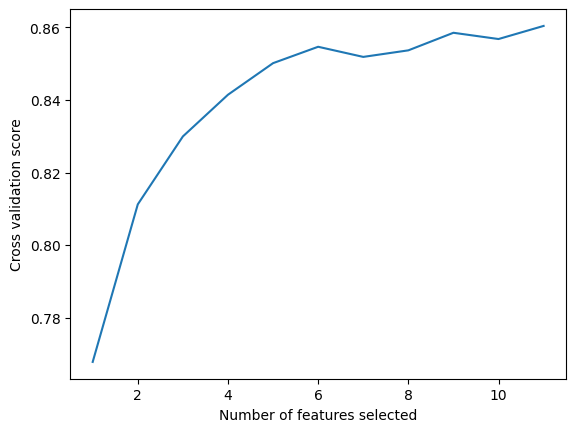

In [ ]:
# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score")
plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
plt.show()

In [ ]:
feature_names = x_train.columns  # Assuming the last column is the target column
selected_features = [feature for feature, selected in zip(feature_names, rfecv.support_) if selected]
print("Selected features:", selected_features)

Selected features: ['POLICY_TERM_YEARS', 'ANNUAL_FEES', 'POLICY_OWNER_MARITAL_STATUS', 'POLICY_OWNER_GENDER', 'POLICY_OWNER_ANNUAL_INCOME', 'POLICY_OWNER_OCCUPATION_ID', 'PRODUCT_TYPE', 'POLICY_OWNER_AGE_AT_ISSUE', 'TOTAL_LA', 'PAYMENT_MODE', 'AGENT_CODE']


Rename x_train to x_select

In [ ]:
x_select = x_train.iloc[:, list_features]
x_select.head()

,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE
0,0.247312,2.226120e-04,0.333333,1.0,0.001692,0.2,0.0,0.673077,1.000000,0.00,0.925806
1,0.537634,1.000000e-09,0.333333,1.0,0.001885,0.0,1.0,0.346154,0.666667,0.50,0.230225
2,0.086022,2.369205e-03,0.333333,0.0,0.001115,0.0,0.0,0.365385,0.333333,0.25,0.456516
3,0.139785,2.007927e-03,0.333333,1.0,0.001115,0.0,0.0,0.403846,0.333333,0.75,0.844645
4,0.139785,3.089850e-04,0.333333,1.0,0.023039,0.0,0.0,0.500000,0.666667,0.00,0.230129


In [ ]:
from sklearn.model_selection import cross_val_score
from collections import Counter
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV

In [ ]:
kfold = StratifiedKFold(n_splits=5, random_state=14, shuffle=True)

def grid_model(x, y , model , param):
    grid=GridSearchCV(estimator=model, param_grid=param, scoring="roc_auc", cv=kfold, n_jobs=-1)
    grid.fit(x, y)
    print("Best Score: %f use parameters: %s" % (grid.best_score_, grid.best_params_))
# -------------------------------------------------------
    
def cross_validation(x, y, model):
    result= cross_val_score(model, x, y, cv=kfold, scoring="roc_auc", n_jobs=-1)
    print("Score: %f" % result.mean())

In [ ]:
counter = Counter(y)
estimate = counter[0] / counter[1]
print('Estimate: %.3f' % estimate)

Estimate: 1.000


In [ ]:
modelXGB = XGBClassifier(n_jobs=-1, random_state=14, 
                         scale_pos_weight=estimate, 
                         n_estimators= 280, learning_rate=0.08, 
                         max_depth=3, subsample=0.5)

scores = cross_validation(x_select, y, modelXGB)
print(scores)

Score: 0.771205
None


Test set

Encoding test set

In [ ]:
df_cat_2 = df_imputed_2.copy()

cate_columns = [i for i in df_cat_2.columns if df_cat_2[i].dtypes == "O"]
cate_columns = list(df_cat_2.select_dtypes(exclude = "number").columns)
cate_columns

for col in cate_columns:
  df_cat_2[col] = label_encoder.fit_transform(df_cat_2[col])
display(df_cat_2.head(5))
print(df_cat_2.info())

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE,LAPSE_STATUS
0,43,9,149999.88,1,1,549996,1,1,44,2,1,143988,NaN
1,46,9,100000.00,1,1,399996,5,1,29,1,0,584377,NaN
2,35,9,100000.00,1,1,999996,1,1,57,2,0,599099,NaN
3,25,9,100000.00,1,1,350004,1,1,39,3,0,301711,NaN
4,34,9,100000.80,2,1,300000,1,1,29,0,1,688,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235 entries, 0 to 234
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   POLICY_OWNER_ID              235 non-null    int64  
 1   POLICY_TERM_YEARS            235 non-null    int64  
 2   ANNUAL_FEES                  235 non-null    float64
 3   POLICY_OWNER_MARITAL_STATUS  235 non-null    int64  
 4   POLICY_OWNER_GENDER          235 non-null    int64  
 5   POLICY_OWNER_ANNUAL_INCOME   235 non-null    int64  
 6   POLICY_OWNER_OCCUPATION_ID   235 non-null    int64  
 7   PRODUCT_TYPE                 235 non-null    int64  
 8   POLICY_OWNER_AGE_AT_ISSUE    235 non-null    int64  
 9   TOTAL_LA                     235 non-null    int64  
 10  PAYMENT_MODE                 235 non-null    int64  
 11  AGENT_CODE                   235 non-null    int64  
 12  LAPSE_STATUS                 0 non-null      float64
dtypes: float64(2), int64

Define target, feature for test set

In [ ]:
target = df_cat_2['LAPSE_STATUS']
feature = df_cat_2.drop('LAPSE_STATUS', axis=1)

## Scale test dataset

In [ ]:
df_scaled_test = pd.DataFrame(mmscaler.fit_transform(feature)) #, columns=y_test.columns)
# Create a new DataFrame with the scaled features and the target column
df_scaled_test = pd.DataFrame(df_scaled_test, columns = feature.columns)
df_scaled_test['LAPSE_STATUS'] = target

Transform test dataset

In [ ]:
feature.columns

Index(['POLICY_OWNER_ID', 'POLICY_TERM_YEARS', 'ANNUAL_FEES',
       'POLICY_OWNER_MARITAL_STATUS', 'POLICY_OWNER_GENDER',
       'POLICY_OWNER_ANNUAL_INCOME', 'POLICY_OWNER_OCCUPATION_ID',
       'PRODUCT_TYPE', 'POLICY_OWNER_AGE_AT_ISSUE', 'TOTAL_LA', 'PAYMENT_MODE',
       'AGENT_CODE'],
      dtype='object')

In [ ]:
list_features = ['POLICY_OWNER_ID', 'POLICY_TERM_YEARS', 'ANNUAL_FEES',
       'POLICY_OWNER_MARITAL_STATUS', 'POLICY_OWNER_GENDER',
       'POLICY_OWNER_ANNUAL_INCOME', 'POLICY_OWNER_OCCUPATION_ID',
       'PRODUCT_TYPE', 'POLICY_OWNER_AGE_AT_ISSUE', 'TOTAL_LA', 'PAYMENT_MODE',
       'AGENT_CODE']

In [ ]:
x_test = mmscaler.transform(feature)
x_test=pd.DataFrame(x_test, columns = feature.columns)
x_select_test = x_test[list_features]
x_select_test.head()

,POLICY_OWNER_ID,POLICY_TERM_YEARS,ANNUAL_FEES,POLICY_OWNER_MARITAL_STATUS,POLICY_OWNER_GENDER,POLICY_OWNER_ANNUAL_INCOME,POLICY_OWNER_OCCUPATION_ID,PRODUCT_TYPE,POLICY_OWNER_AGE_AT_ISSUE,TOTAL_LA,PAYMENT_MODE,AGENT_CODE
0,0.183761,0.0,1.470585e-02,0.333333,1.0,0.006438,0.0,1.0,0.500000,0.666667,0.333333,0.099520
1,0.196581,0.0,0.000000e+00,0.333333,1.0,0.004292,0.8,1.0,0.211538,0.333333,0.000000,0.405365
2,0.149573,0.0,0.000000e+00,0.333333,1.0,0.012876,0.0,1.0,0.750000,0.666667,0.000000,0.415589
3,0.106838,0.0,0.000000e+00,0.333333,1.0,0.003577,0.0,1.0,0.403846,1.000000,0.000000,0.209057
4,0.145299,0.0,2.352941e-07,0.666667,1.0,0.002861,0.0,1.0,0.211538,0.000000,0.333333,0.000000


In [ ]:
 x_select_test = x_select_test.drop(['POLICY_OWNER_ID'], axis=1)

## Modeling

## Fitting models

### XGB Classifier

In [ ]:
modelXGB.fit(x_select, y)
#y_pred_XGB = modelXGB.predict(x_select)
#y_pred_XGB_test = modelXGB.predict(x_select_test)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.08, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=280, n_jobs=-1, num_parallel_tree=None,
              predictor=None, random_state=14, ...)

### AdaBoost Classifier

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
model_Adaboost = AdaBoostClassifier(random_state = 1)
model_Adaboost.fit(x_select, y)
#model_Adaboost_test = model_Adaboost.predict(x_select_test)

AdaBoostClassifier(random_state=1)

### CatBoostClassifier

In [ ]:
pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from catboost import CatBoostClassifier
parameters = {
        'learning_rate': 0.3,
        'depth': 3,
        'l2_leaf_reg': 0.05
}
model_CatBoost = CatBoostClassifier(**parameters)
# ,cat_features=categorical_features_indices
model_CatBoost.fit(x_select, y,verbose=False)

### Random Forest Classifier

In [ ]:
from sklearn.ensemble  import RandomForestClassifier
rf = RandomForestClassifier(criterion='gini', max_depth=4, random_state=33)
rf.fit(x_select, y)

RandomForestClassifier(max_depth=4, random_state=33)

### DecisionTree Classifier

In [ ]:
from sklearn.tree import DecisionTreeClassifier
tree_class = DecisionTreeClassifier(criterion='gini', max_depth=4, splitter='best', random_state=33)
tree_class.fit(x_select, y)

DecisionTreeClassifier(max_depth=4, random_state=33)

In [ ]:
!pip install catboost
from catboost import CatBoostClassifier

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Predict

In [ ]:
# Predict XGBClassifier
y_pred_XGB_test = modelXGB.predict(x_select_test)
# Predict AdaBoost Classifier
y_pred_ada_test = model_Adaboost.predict(x_select_test)
# Predict CatBoost Classifier
y_pred_catb_test = model_CatBoost.predict(x_select_test)
# Predict Random Forest Classifier
y_pred_rfc_test = rf.predict(x_select_test)
# Predict DecisionTree Classifier
y_pred_dtc_test = tree_class.predict(x_select_test)

In [ ]:
print(y_pred_XGB_test)

[0 1 1 1 1 1 1 1 1 0 1 0 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0 1 1 0 1 0
 1 1 1 0 0 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 0 1 0 1 1 0 1 1 1
 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 0 1 0 1 1 0 1
 1 1 1 1 0 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1
 1 1 1 1 1 0 1 1 0 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1 0 1 0 1 1
 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1
 1 1 1 0 1 1 1 1 1 0 1 0 1]


In [ ]:
print(y_pred_ada_test)

[0 0 1 1 1 1 1 1 1 0 1 0 0 0 1 0 0 0 1 1 1 1 1 1 1 1 0 0 0 0 0 0 1 1 0 1 0
 0 1 1 0 0 0 0 0 1 1 0 0 1 1 1 1 1 0 0 1 1 1 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0
 1 0 0 0 1 1 0 1 0 1 0 1 1 0 1 1 0 0 1 0 0 1 0 1 1 0 0 0 0 0 0 1 0 1 1 0 1
 1 1 1 1 0 0 1 0 1 1 1 0 0 1 1 1 1 1 0 0 0 0 0 0 1 1 0 0 0 1 0 0 1 1 1 0 0
 1 0 1 0 1 0 1 0 1 1 0 1 1 0 1 1 1 1 0 0 1 0 1 0 0 0 0 1 1 0 1 1 0 1 0 0 1
 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1 0 1 1 0 0 1 1 0 1 1 0 1 1 1 0 0 0 0
 1 0 1 0 1 0 1 0 0 0 0 0 0]


In [ ]:
print(y_pred_catb_test)

[1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 0 1 1
 1 1 1 0 0 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 0 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 0 1
 1 1 1 0 1 0 1 1 1 0 1 1 1 1 0 1 1 1 1 0 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1
 1 0 1 0 1 0 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1
 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 0 1 0 1 0 1 1 1 0 1 0 1]


After having y_predicts from many models, I will use some combination techniques to combine predictions. This should perform better than normal evaluation since in this case, I dont have y_test (target in test set).
 

In [ ]:
# Combine predictions using majority voting
y_combined_pred = np.column_stack((y_pred_XGB_test, y_pred_ada_test, y_pred_catb_test, y_pred_rfc_test, y_pred_dtc_test))
y_pred_combined = np.apply_along_axis(lambda x: np.argmax(np.bincount(x)), axis=1, arr=y_combined_pred)
y_pred_combined

array([0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0,
       0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0,
       1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0,
       1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1,
       0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1])

In [ ]:
# Combine predicted probabilities by averaging
y_prob_combined = np.column_stack((y_pred_XGB_test, y_pred_ada_test, y_pred_catb_test, y_pred_rfc_test, y_pred_dtc_test))
y_prob_average = np.mean(y_prob_combined, axis=1)
# Set the threshold/cutoff value
threshold = 0.5

# Convert averaged probabilities to binary predictions
y_pred_binary = np.where(y_prob_average > threshold, 1, 0)
y_pred_binary

array([0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0,
       0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0,
       1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0,
       1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1,
       0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1])

## Evaluation

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, f1_score

# Define the models you want to evaluate
models = [
    XGBClassifier(),
    AdaBoostClassifier(),
    CatBoostClassifier(),
    RandomForestClassifier(),
    DecisionTreeClassifier(),
    ]

for clf in models:
    name = clf.__class__.__name__
    clf.fit(x_select, y)
    prediction = clf.predict(x_select_test)

    rank = pd.DataFrame(data=np.column_stack([prediction, y_pred_XGB_test]),
                                index=x_select_test.index.values,columns=['Predicted','Real'])
    accurracy = np.sum(rank.Predicted.values == rank.Real.values)
    accurracy = accurracy/len(x_select_test)
    print(accurracy, name)

0.851063829787234 XGBClassifier
0.6425531914893617 AdaBoostClassifier
Learning rate set to 0.029962
0:	learn: 0.6880543	total: 7.3ms	remaining: 7.3s
1:	learn: 0.6829149	total: 13ms	remaining: 6.5s
2:	learn: 0.6766899	total: 18.6ms	remaining: 6.17s
3:	learn: 0.6726244	total: 24.2ms	remaining: 6.02s
4:	learn: 0.6677088	total: 30ms	remaining: 5.97s
5:	learn: 0.6642949	total: 35.2ms	remaining: 5.83s
6:	learn: 0.6608331	total: 40.9ms	remaining: 5.8s
7:	learn: 0.6573249	total: 46.1ms	remaining: 5.72s
8:	learn: 0.6536563	total: 51.8ms	remaining: 5.7s
9:	learn: 0.6500002	total: 57.4ms	remaining: 5.69s
10:	learn: 0.6476338	total: 63.3ms	remaining: 5.69s
11:	learn: 0.6452101	total: 69.2ms	remaining: 5.7s
12:	learn: 0.6429351	total: 75ms	remaining: 5.7s
13:	learn: 0.6405332	total: 80.8ms	remaining: 5.69s
14:	learn: 0.6384029	total: 86.6ms	remaining: 5.68s
15:	learn: 0.6364246	total: 92.7ms	remaining: 5.7s
16:	learn: 0.6348276	total: 98.7ms	remaining: 5.71s
17:	learn: 0.6326603	total: 105ms	remain

## Result

| Model |	Accuracy | 
|:-------|:------------|
| XGBoostClassifier |	82.97% |	
| AdaBoostClassifier 	| 60.42%|
| CatBoostClassifier 	| 86.80% |	
| RandomForestClassifier 	| 83.40%|	
| DecisionTreeClassifier 	| 66.38% |	

So based on the result above, I will choose CatBoostClassifier with 86.80% accuracy performance

In [ ]:
output = pd.DataFrame({'POLICY_OWNER_ID': df_imputed_2.POLICY_OWNER_ID, 
                       'LAPSE_STATUS': y_pred_binary})
output.head(20)

,POLICY_OWNER_ID,LAPSE_STATUS
0,A01579,0
1,A01732,0
2,A01370,1
3,A01091,1
4,A01311,1
5,A01512,1
6,A04153,1
7,A03680,1
8,A01146,1
9,A01473,0


In [ ]:
output['LAPSE_STATUS'].value_counts()

1    158
0     77
Name: LAPSE_STATUS, dtype: int64